In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [3]:
import os
HOME = os.getcwd()
print(HOME)

/kaggle/working


In [4]:
%cd {HOME}
!git clone https://github.com/IDEA-Research/GroundingDINO.git
%cd {HOME}/GroundingDINO
!pip install -q -e .
!pip install -q roboflow

/kaggle/working
fatal: destination path 'GroundingDINO' already exists and is not an empty directory.
/kaggle/working/GroundingDINO
Reason for being yanked: deprecated, use 4.8.0.76
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-decision-forests 1.8.1 requires wurlitzer, which is not installed.
jupyterlab 4.2.1 requires jupyter-lsp>=2.0.0, but you have jupyter-lsp 1.5.1 which is incompatible.
jupyterlab-lsp 5.1.0 requires jupyter-lsp>=2.0.0, but you have jupyter-lsp 1.5.1 which is incompatible.
libpysal 4.9.2 requires packaging>=22, but you have packaging 21.3 which is incompatible.
libpysal 4.9.2 requires shapely>=2.0.1, but you have shapely 1.8.5.post1 which is incompatible.
momepy 0.7.0 requires shapely>=2, but you have shapely 1.8.5.post1 which is incompatible.
osmnx 1.9.3 requires shapely>=2.0, but you have shapely 1.8.5.post1 which is incompat

In [5]:
import os

CONFIG_PATH = os.path.join(HOME, "GroundingDINO/groundingdino/config/GroundingDINO_SwinT_OGC.py")
print(CONFIG_PATH, "; exist:", os.path.isfile(CONFIG_PATH))

/kaggle/working/GroundingDINO/groundingdino/config/GroundingDINO_SwinT_OGC.py ; exist: True


In [6]:
%cd {HOME}
!mkdir {HOME}/weights
%cd {HOME}/weights

!wget -q https://github.com/IDEA-Research/GroundingDINO/releases/download/v0.1.0-alpha/groundingdino_swint_ogc.pth

/kaggle/working
/kaggle/working/weights


In [7]:
import os

WEIGHTS_NAME = "groundingdino_swint_ogc.pth"
WEIGHTS_PATH = os.path.join(HOME, "weights", WEIGHTS_NAME)
print(WEIGHTS_PATH, "; exist:", os.path.isfile(WEIGHTS_PATH))

/kaggle/working/weights/groundingdino_swint_ogc.pth ; exist: True


In [8]:
%cd {HOME}/GroundingDINO

from groundingdino.util.inference import load_model, load_image, predict, annotate

model = load_model(CONFIG_PATH, WEIGHTS_PATH)

/kaggle/working/GroundingDINO


final text_encoder_type: bert-base-uncased


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

final text_encoder_type: bert-base-uncased


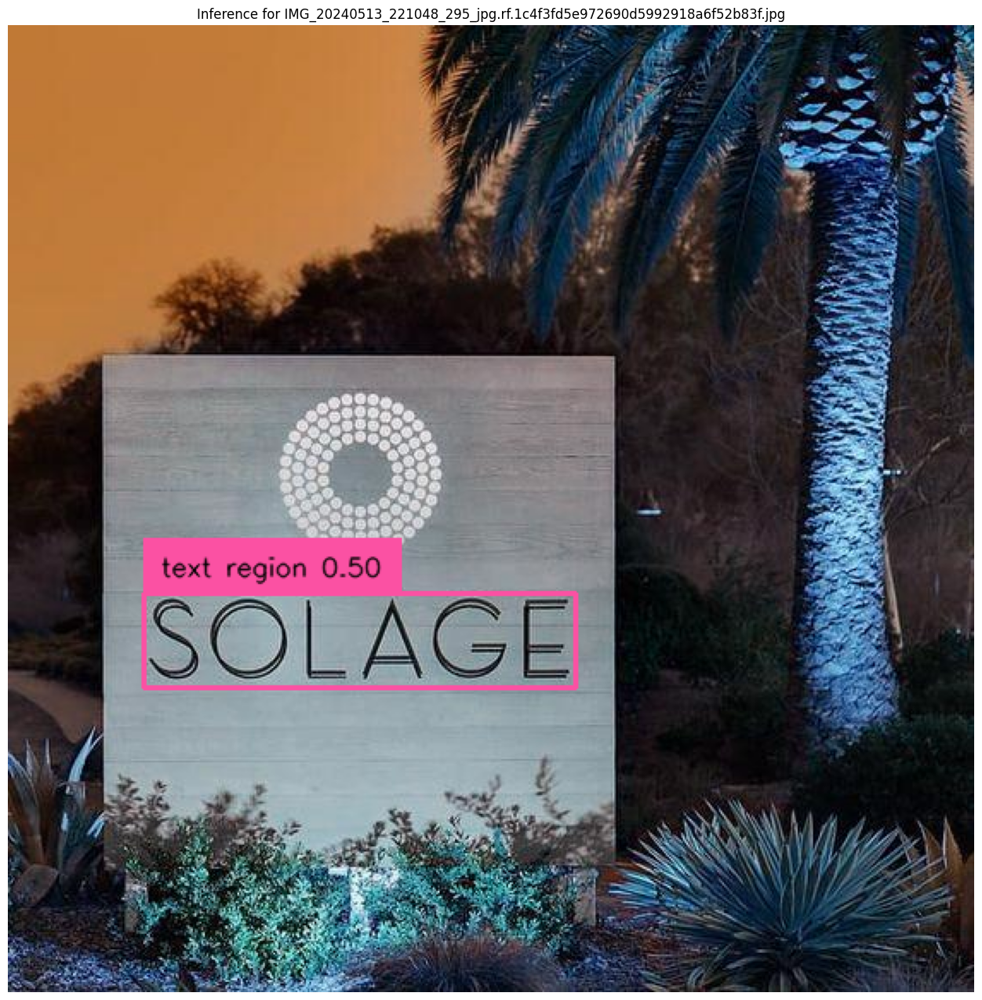

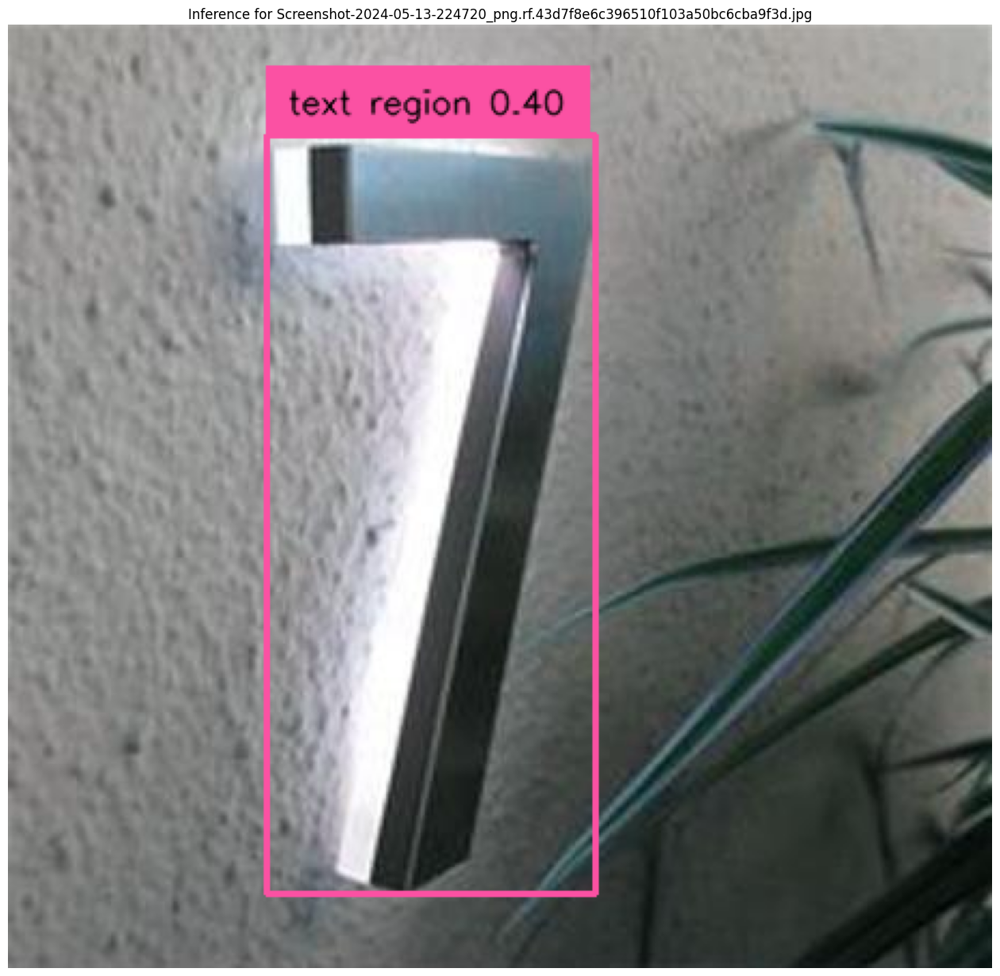

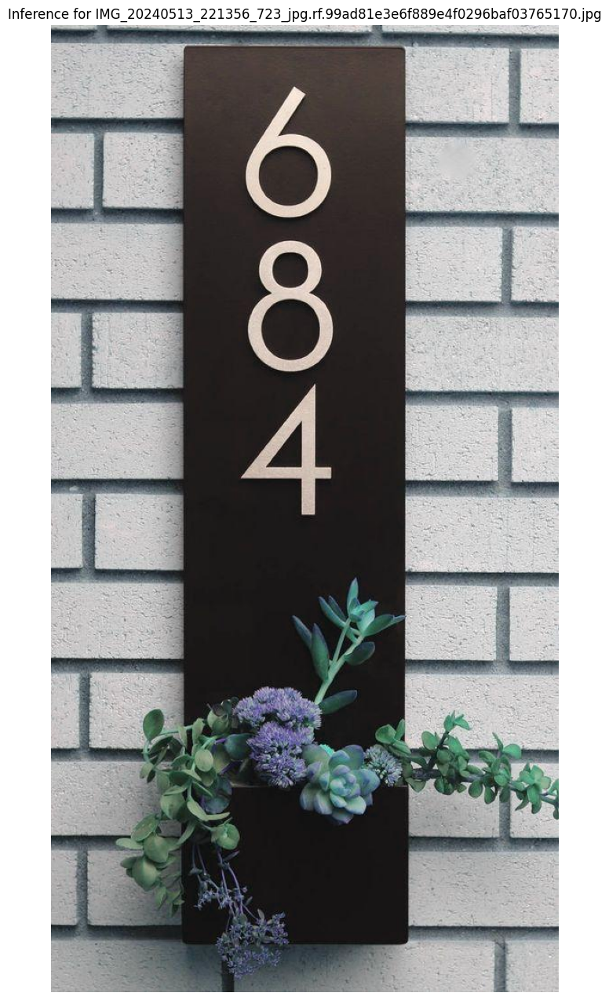

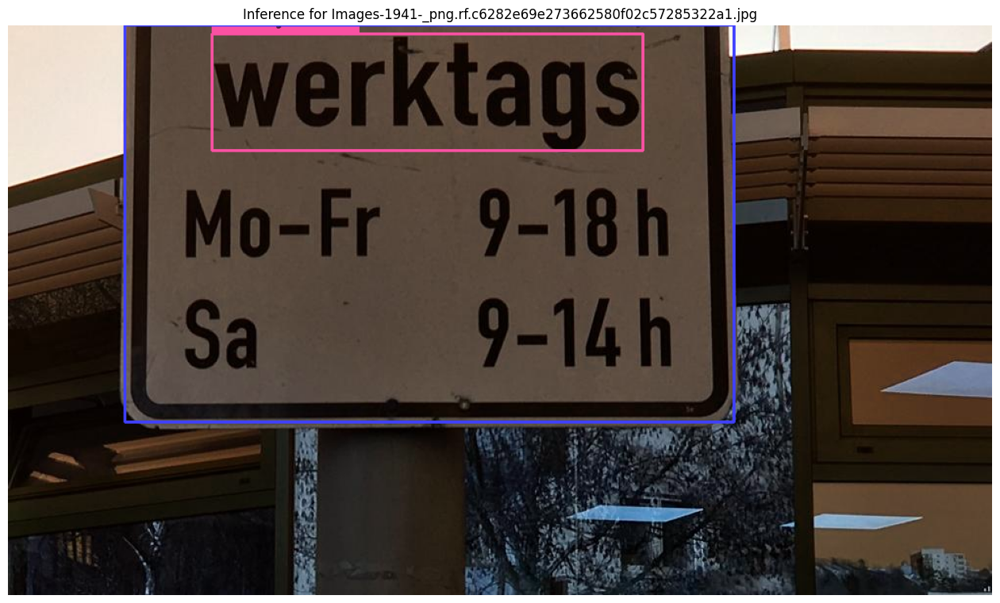

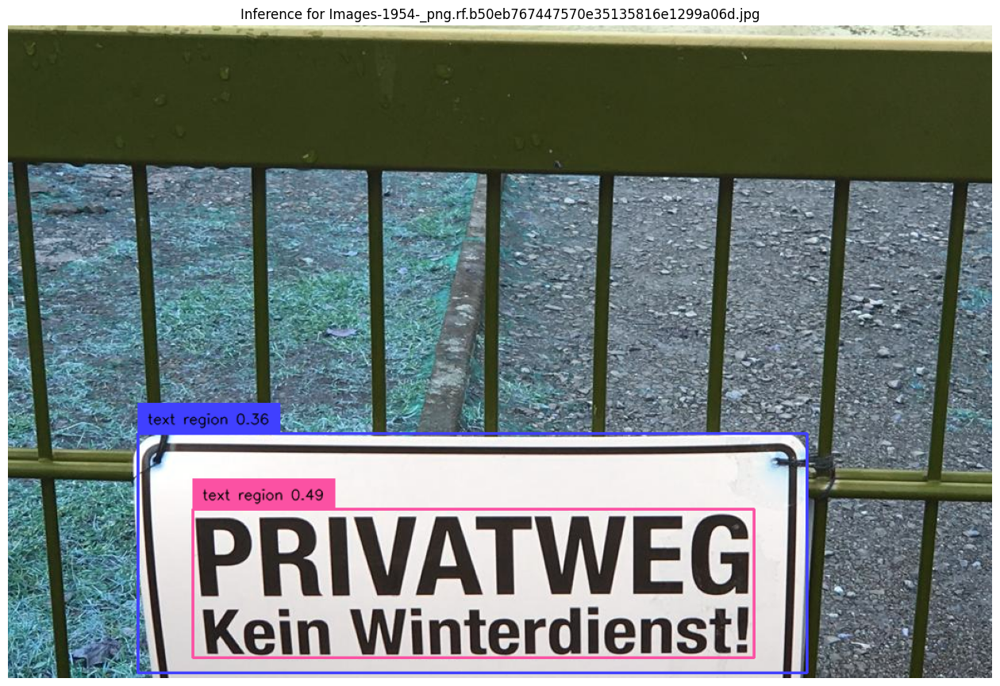

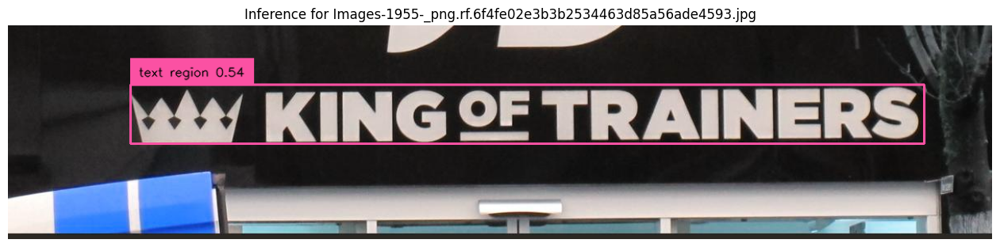

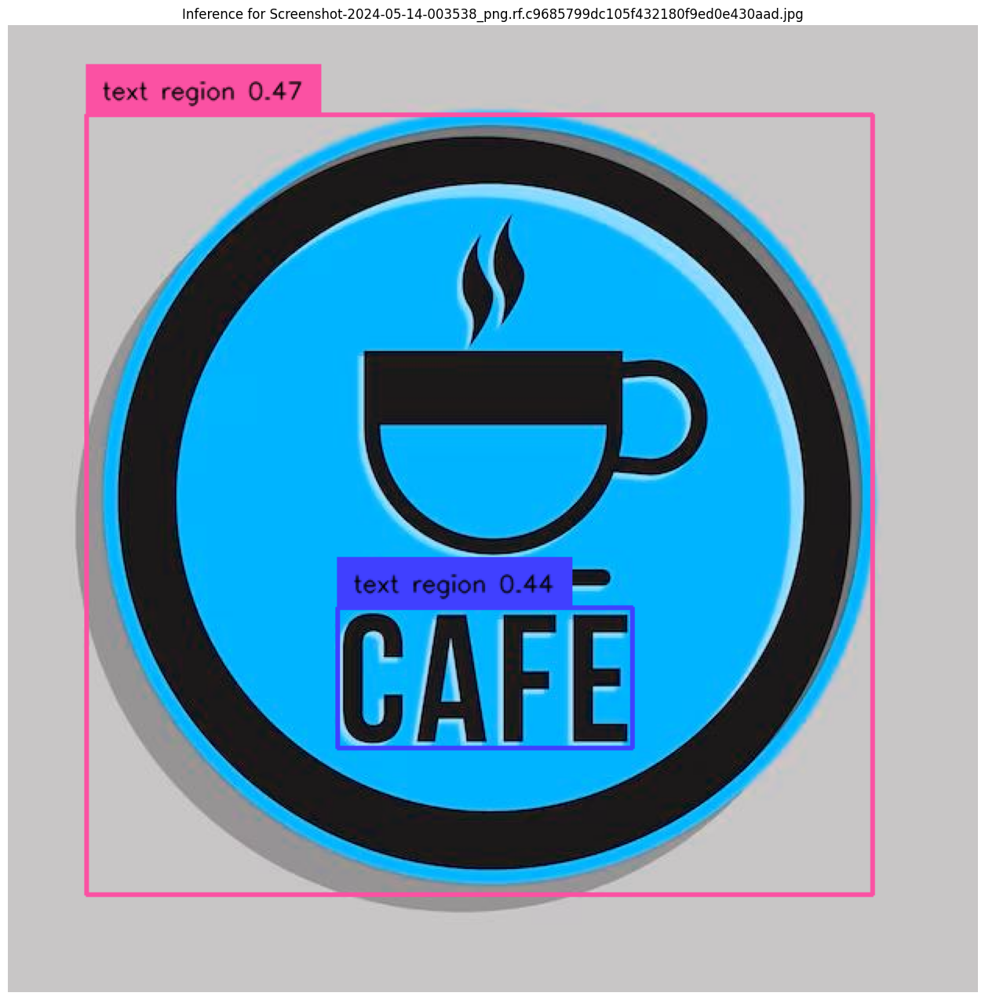

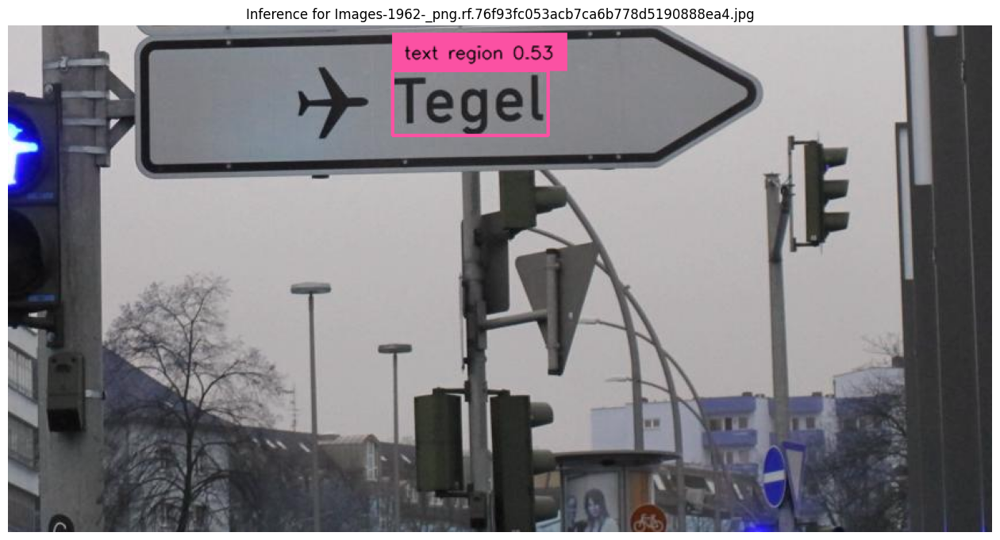

In [ ]:
import os
import warnings
import torch
from PIL import Image
import matplotlib.pyplot as plt
from torchvision import transforms
import supervision as sv
from groundingdino.util.inference import load_model, predict, annotate

# Suppress all warnings
warnings.filterwarnings("ignore")

# Ensure the correct paths
HOME = os.getcwd()
config_path = os.path.join(HOME, '/kaggle/working/GroundingDINO/groundingdino/config/GroundingDINO_SwinT_OGC.py')
weights_path = os.path.join(HOME, '/kaggle/working/weights/groundingdino_swint_ogc.pth')

# Load model
model = load_model(config_path, weights_path)

# Ensure the model uses CPU
device = torch.device('cpu')
model.to(device)

# Define the test images path
TEST_IMAGES_PATH = '/kaggle/input/yolovmawa/test1'
TEXT_PROMPT = "text region"
BOX_THRESHOLD = 0.35
TEXT_THRESHOLD = 0.25

# Load the image function
def load_image(image_path):
    image = Image.open(image_path).convert("RGB")
    image_source = np.array(image)
    transform = transforms.Compose([
        transforms.ToTensor()
    ])
    image = transform(image)
    return image_source, image

# Create a directory to save annotated images
output_dir = os.path.join(HOME, 'results')
os.makedirs(output_dir, exist_ok=True)

# Loop through each image in the test directory
for image_name in os.listdir(TEST_IMAGES_PATH):
    IMAGE_PATH = os.path.join(TEST_IMAGES_PATH, image_name)
    
    # Perform prediction
    image_source, image = load_image(IMAGE_PATH)
    
    boxes, logits, phrases = predict(
        model=model, 
        image=image.to(device),  # Ensure the image is moved to the correct device
        caption=TEXT_PROMPT, 
        box_threshold=BOX_THRESHOLD, 
        text_threshold=TEXT_THRESHOLD,
        device=device  # Pass the device to the predict function
    )
    
    # Annotate the image
    annotated_frame = annotate(image_source=image_source, boxes=boxes, logits=logits, phrases=phrases)
    
    # Save the annotated image
    output_image_path = os.path.join(output_dir, f"annotated_{image_name}")
    Image.fromarray(annotated_frame).save(output_image_path)
    
    # Plot the annotated image
    plt.figure(figsize=(16, 16))
    plt.imshow(annotated_frame)
    plt.axis('off')
    plt.title(f"Inference for {image_name}")
    plt.show()
